In [9]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("/content/covtype.csv")

In [3]:
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


In [4]:
df.dtypes

,0
Elevation,int64
Aspect,int64
Slope,int64
Horizontal_Distance_To_Hydrology,int64
Vertical_Distance_To_Hydrology,int64
Horizontal_Distance_To_Roadways,int64
Hillshade_9am,int64
Hillshade_Noon,int64
Hillshade_3pm,int64
Horizontal_Distance_To_Fire_Points,int64


In [5]:
df.var()

,0
Elevation,7.839145e+04
Aspect,1.252468e+04
Slope,5.607377e+01
Horizontal_Distance_To_Hydrology,4.517723e+04
Vertical_Distance_To_Hydrology,3.398334e+03
Horizontal_Distance_To_Roadways,2.431276e+06
Hillshade_9am,7.166269e+02
Hillshade_Noon,3.908014e+02
Hillshade_3pm,1.464940e+03
Horizontal_Distance_To_Fire_Points,1.753493e+06


In [6]:
from sklearn.model_selection import train_test_split
X = df.drop(columns=['Cover_Type'])
y = df['Cover_Type']

In [7]:
from sklearn.linear_model import Lasso
lasso = Lasso(alpha=0.01)  # Adjust alpha as needed
lasso.fit(X, y)
important_features = X.columns[lasso.coef_ != 0]
print("Selected Features:", important_features)


Selected Features: Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
       'Wilderness_Area4', 'Soil_Type10', 'Soil_Type22', 'Soil_Type23',
       'Soil_Type24', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33',
       'Soil_Type38', 'Soil_Type39', 'Soil_Type40'],
      dtype='object')


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.486e+02, tolerance: 1.133e+02
  model = cd_fast.enet_coordinate_descent(


In [8]:
selected_features = ['Elevation', 'Aspect', 'Slope',
                     'Horizontal_Distance_To_Hydrology',
                     'Vertical_Distance_To_Hydrology',
                     'Horizontal_Distance_To_Roadways',
                     'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
                     'Horizontal_Distance_To_Fire_Points',
                     'Wilderness_Area1', 'Wilderness_Area4',
                     'Soil_Type10', 'Soil_Type22', 'Soil_Type23',
                     'Soil_Type24', 'Soil_Type31', 'Soil_Type32',
                     'Soil_Type33', 'Soil_Type38', 'Soil_Type39',
                     'Soil_Type40']

X_reduced = X[selected_features]


In [30]:
#!pip install ydata-profiling
from ydata_profiling import ProfileReport

In [31]:
# Create a ProfileReport
profile = ProfileReport(X_reduced, title="Sample Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
len(selected_features)

22

In [14]:
X[selected_features].isna().sum()

,0
Elevation,0
Aspect,0
Slope,0
Horizontal_Distance_To_Hydrology,0
Vertical_Distance_To_Hydrology,0
Horizontal_Distance_To_Roadways,0
Hillshade_9am,0
Hillshade_Noon,0
Hillshade_3pm,0
Horizontal_Distance_To_Fire_Points,0


In [10]:
# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_reduced)

In [15]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)


In [16]:
# Train the Random Forest model
rf_model = RandomForestClassifier(random_state=42, n_estimators=100)
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [24]:
# Predict on the test set
y_pred = rf_model.predict(X_test[[0]])
y_pred

array([1])

In [26]:
y_test.iloc[0]

1

In [17]:
# Predict on the test set
y_pred = rf_model.predict(X_test)

In [18]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.95


In [19]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           1       0.97      0.94      0.95     42557
           2       0.95      0.97      0.96     56500
           3       0.94      0.96      0.95      7121
           4       0.91      0.82      0.86       526
           5       0.95      0.77      0.85      1995
           6       0.93      0.89      0.91      3489
           7       0.98      0.95      0.97      4015

    accuracy                           0.95    116203
   macro avg       0.95      0.90      0.92    116203
weighted avg       0.95      0.95      0.95    116203



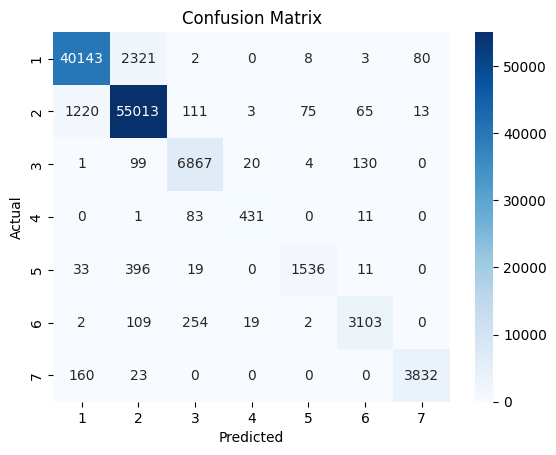

In [20]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

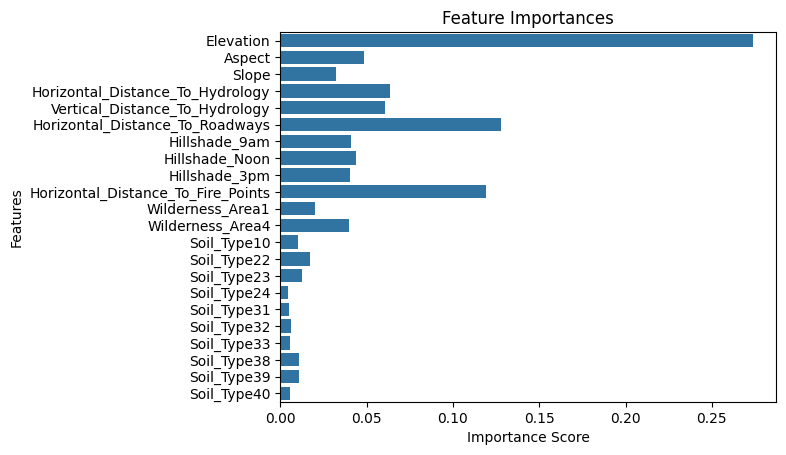

In [21]:
# Feature Importance Visualization
importances = rf_model.feature_importances_
sns.barplot(x=importances, y=selected_features)
plt.title("Feature Importances")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()